# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

`Для того чтобы случайное разбиение датасета (и другие случайные разбиения) никак не влияли на сравнения показателей моделей. Также чтобы сравнить различные ДЗ между собой.`

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [114]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [115]:
print(f'Дубликаты для train: {df_train.duplicated().any()}')
print(f'Дубликаты для test: {df_test.duplicated().any()}')

Дубликаты для train: True
Дубликаты для test: True


In [116]:
print("Дублирующиеся строки:")
df_train[df_train.duplicated(keep=False)]

Дублирующиеся строки:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
31,Maruti Alto 800 CNG LXI Optional,2019,330000,10000,CNG,Individual,Manual,Second Owner,33.44 km/kg,796 CC,40.3 bhp,60Nm@ 3500rpm,4.0
32,Maruti Alto K10 VXI Airbag,2019,366000,15000,Petrol,Individual,Manual,First Owner,23.95 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
33,Hyundai Verna VTVT 1.6 SX Option,2019,1149000,5000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1591 CC,121.3 bhp,151Nm@ 4850rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6880,Renault Captur 1.5 Diesel RXT,2018,1265000,12000,Diesel,Individual,Manual,First Owner,20.37 kmpl,1461 CC,108.45 bhp,240Nm@ 1750rpm,5.0
6881,Maruti Ciaz Alpha Diesel,2019,1025000,32000,Diesel,Individual,Manual,First Owner,28.09 kmpl,1248 CC,88.50 bhp,200Nm@ 1750rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [117]:
print("Дублирующиеся строки:")
df_test[df_test.duplicated(keep=False)]

Дублирующиеся строки:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
11,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
39,Skoda Rapid 1.6 MPI AT Elegance,2016,645000,11000,Petrol,Dealer,Automatic,First Owner,14.3 kmpl,1598 CC,103.5 bhp,153Nm@ 3800rpm,5.0
56,Maruti Ritz VXi,2012,320000,40000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,85.80 bhp,114Nm@ 4000rpm,5.0
58,Hyundai i20 Sportz 1.2,2012,300000,120000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.5 kmpl,2987 CC,254.79 bhp,620Nm@ 1600-2400rpm,5.0
936,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
949,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
971,Maruti Ertiga SHVS ZDI Plus,2017,750000,50000,Diesel,Individual,Manual,First Owner,24.52 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,7.0


Судя по последним двум строкам - есть

Дубликаты есть

In [118]:
print("-"*30)
print("Пропущенные значения по каждому столбцу")
print("-"*30)
print(df_train.isna().sum().sort_values(ascending=False))
print("-"*30)
print(f"Доля строк с пропущенными значениями среди всех строк = {round((df_train.shape[0] - df_train.dropna().shape[0])*100/len(df_train), 3)}%")

------------------------------
Пропущенные значения по каждому столбцу
------------------------------
torque           203
mileage          202
engine           202
seats            202
max_power        196
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
dtype: int64
------------------------------
Доля строк с пропущенными значениями среди всех строк = 2.9%


In [119]:
print("-"*30)
print("Пропущенные значения по каждому столбцу")
print("-"*30)
print(df_test.isna().sum().sort_values(ascending=False))
print("-"*30)
print(f"Доля строк с пропущенными значениями среди всех строк = {round((df_test.shape[0] - df_test.dropna().shape[0])*100/len(df_test), 3)}%")

------------------------------
Пропущенные значения по каждому столбцу
------------------------------
mileage          19
engine           19
max_power        19
torque           19
seats            19
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
dtype: int64
------------------------------
Доля строк с пропущенными значениями среди всех строк = 1.9%


In [120]:
!pip install ydata_profiling

In [121]:
from ydata_profiling import ProfileReport

profile_1 = ProfileReport(df_train, title="Train dataset Profiling Report")
profile_1.to_file("Train dataset.html")

profile_2 = ProfileReport(df_test, title="Test dataset Profiling Report")
profile_2.to_file("Test dataset.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [122]:
profile_1

In [123]:
profile_2

**Выводы:**
* Пустых значений достаточно мало и они присутсвуют в одних тех же столбцах и в одних и тех же строках (см. скрин ниже). Их можно просто удалить
* Дубликатов уже чуть больше и их нужно обрабатвыть отдельно, если полные дубликаты, то мы их также удаляем
* Больше всего данных по машинам именно с 2010 по 2020 годы. До этого их существенно меньше
* В некоторых столбцах, таких как selling_price есть существенные выбросы по значениям, от них лучше избавиться

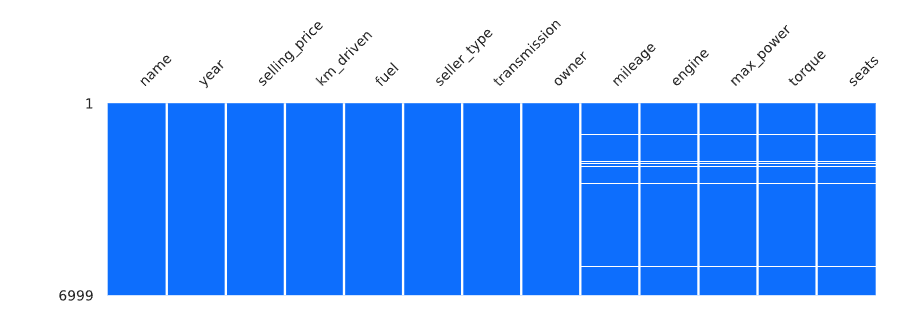

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [124]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [125]:
df_test.describe()

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [126]:
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [127]:
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [128]:
display(df_train.mean(numeric_only=True))
display(df_test.mean(numeric_only=True))

,0
year,2013.818403
selling_price,639515.197171
km_driven,69584.615517
seats,5.419008


,0
year,2013.681000
selling_price,617901.042000
km_driven,71393.341000
seats,5.410805


In [129]:
display(df_train.median(numeric_only=True))
display(df_test.median(numeric_only=True))

,0
year,2015.0
selling_price,450000.0
km_driven,60000.0
seats,5.0


,0
year,2014.0
selling_price,434999.0
km_driven,61500.0
seats,5.0


**Вывод:**
* Среднии значения и медианы у test и train очень близки,следовательно данные test и train распределены приблизительно одинаково.
* У всех числовых столбцов в обоих датасетах есть выбросы. Осоенно характерные выбросы видно у selling_price

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [130]:
features = df_train.drop(columns=['selling_price'])
duplicates = features.duplicated(keep=False)
duplicate_count = duplicates.sum()
print(f"Количество объектов с одинаковым признаковым описанием: {duplicate_count}")

Количество объектов с одинаковым признаковым описанием: 1799


In [131]:
print("Дублирующиеся объекты:")
df_train[duplicates]

Дублирующиеся объекты:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [132]:
df_train = df_train.drop_duplicates(subset=features.columns, keep='first')
df_train.reset_index(drop=True, inplace=True)
print("Обновленный DataFrame после удаления дубликатов:")
df_train

Обновленный DataFrame после удаления дубликатов:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [133]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [134]:
df_train[['mileage', 'engine', 'max_power', 'torque']].head()

,mileage,engine,max_power,torque
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
1,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm
2,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm
3,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)"
4,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm


In [135]:
def preprocess_data(df):
    df['mileage'] = df['mileage'].str.replace(' kmpl', '').str.replace(' km/kg', '').astype('float64')
    df['engine'] = df['engine'].str.replace(' CC', '').astype('float64')
    df['max_power'] = df['max_power'].str.replace(' bhp', '')
    df['max_power'] = pd.to_numeric(df['max_power'], errors='coerce')

    df[['torque', 'max_torque_rpm']] = df['torque'].str.extract(r'([\d.]+)\s*Nm\s*@\s*([\d.]+)\s*rpm', expand=True)
    df['torque'] = df['torque'].astype(float)
    df['max_torque_rpm'] = df['max_torque_rpm'].astype(float)
    return df

df_train = preprocess_data(df_train)
df_test = preprocess_data(df_test)


display(df_train.dtypes)
display(df_test.dtypes)

<ipython-input-135-4f9e5f515e00>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['mileage'] = df['mileage'].str.replace(' kmpl', '').str.replace(' km/kg', '').astype('float64')
<ipython-input-135-4f9e5f515e00>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['engine'] = df['engine'].str.replace(' CC', '').astype('float64')
<ipython-input-135-4f9e5f515e00>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,float64


,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,float64


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [136]:
for column in ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats']:
    median_value = df_train[column].median()
    df_train[column].fillna(median_value, inplace=True)
    df_test[column].fillna(median_value, inplace=True)

<ipython-input-136-bb66eaf09c40>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train[column].fillna(median_value, inplace=True)
<ipython-input-136-bb66eaf09c40>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[column].fillna(median_value, inplace=True)
<ipython-input-136-bb66eaf09c40>:4: FutureWarning: A value is trying to be se

In [137]:
df_train.isna().sum().sum(), df_test.isna().sum().sum()

(0, 0)

**Вывод:**
* Медиана более устойчива к выбросам, среднее же неустойчио и соответственно может быть смещенно. В нашем случае, например есть столбец цены на автомобили, где встречаются редкие дорогие автомобили, цена которых не отражает рынок в целом.
* Медиану следует считать по тренировочным данным для обоих датасетов train и test.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [138]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

<ipython-input-138-c894089ab75a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['engine'] = df_train['engine'].astype(int)
<ipython-input-138-c894089ab75a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['seats'] = df_train['seats'].astype(int)


**Вывод:** Почему возможно рассмотреть seats как категориальную переменну (seats это количество мест в автомобиле) ?
1. Ограниченное количество уникальных значений, их не так много и => можно использовать этот столбец для классификации автомобилей.
2. При анализе данных мы можем быть заинтересованы в том, как разные группы автомобилей (по количеству мест) влияют на другие переменные. Мы сможем с помощью этого столбца граммотно избавиться от выросов ненужных, уникальных автомобилей, ведь зачастую мест в обычном атомобиле ограниченное значение.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

Было:

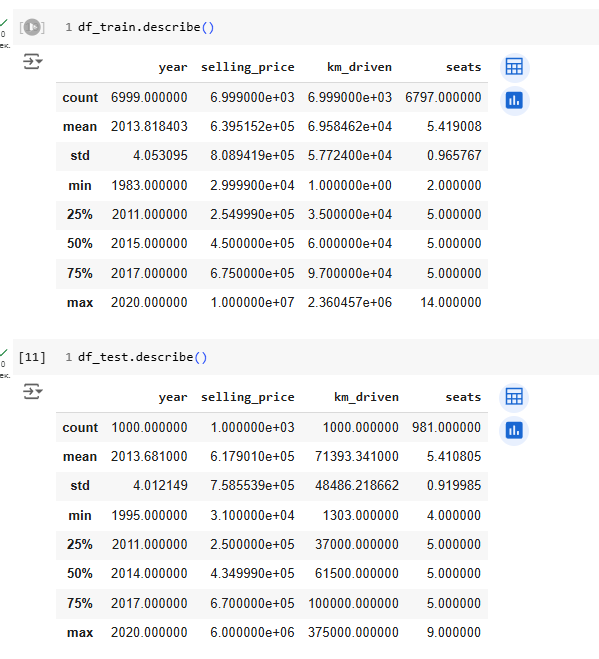

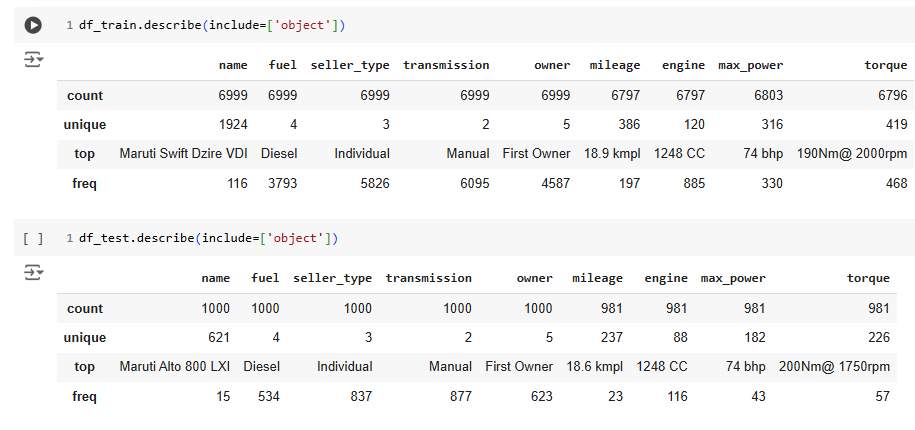

Стало:

In [139]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,126.050849,5.426712,3300.900342
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,47.845845,0.982344,785.828234
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,51.000000,2.000000,1500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,113.000000,5.000000,3000.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,114.000000,5.000000,3500.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,116.000000,5.000000,3500.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,789.000000,14.000000,5000.000000


In [140]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,125.320500,5.403000,3344.246000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,47.211357,0.912921,779.842164
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,48.000000,4.000000,1500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,113.000000,5.000000,3350.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,114.000000,5.000000,3500.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,117.000000,5.000000,3500.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,600.000000,9.000000,5000.000000


In [141]:
((6999-5840) / 6999) * 100

16.55950850121446

**Вывод:**
Если смотреть в целом, то сдвинулись ненамного mean и std, что логично. Сдвиг несущественный. По квантилям, минимальным и максимальным значениям сдвига нет вообще. Могли ли распределения, где мы заполняли пропуски медиаными значениями вообще как-то сместиться - нет, т.к. мы добавляли значения буквально в центр распределения. Но так как мы удалили ещё дубликаты, то произошли несущественные изменения по mean и std.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

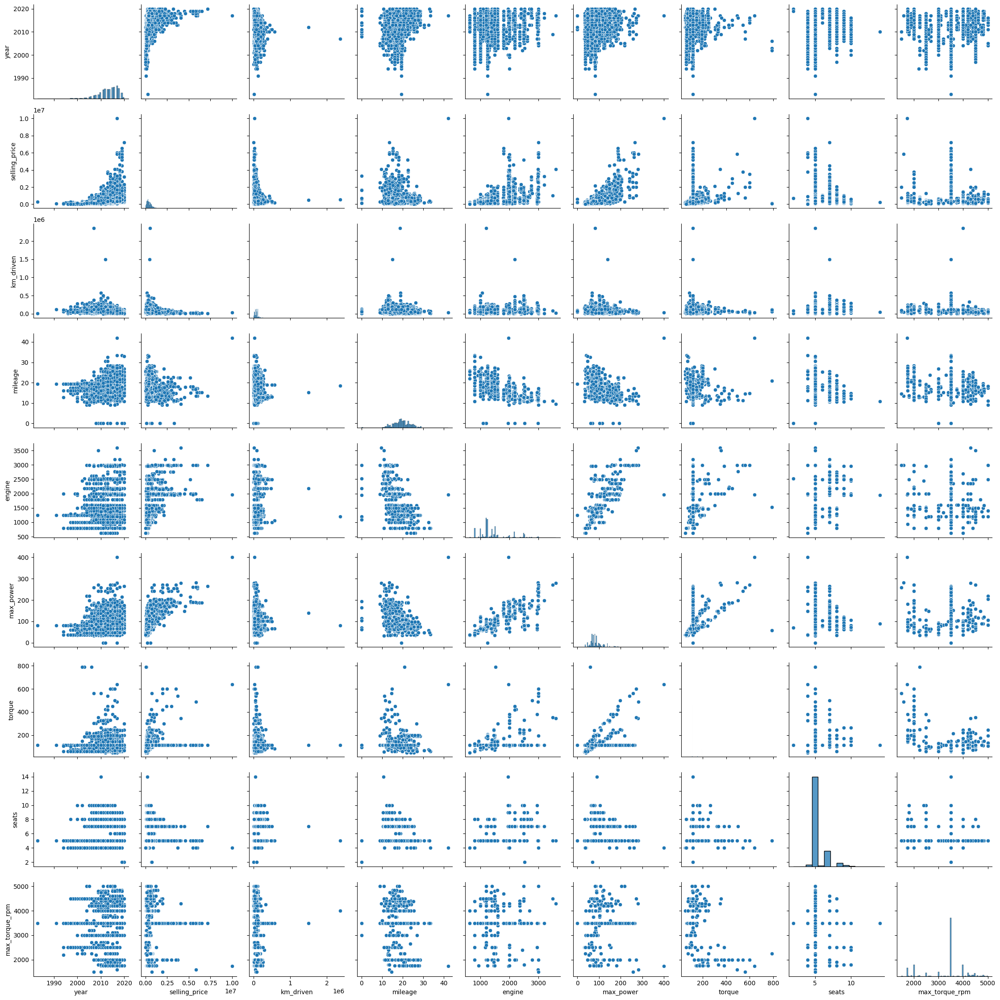

In [142]:
import seaborn as sns

sns.pairplot(df_train)
plt.tight_layout()
plt.show()

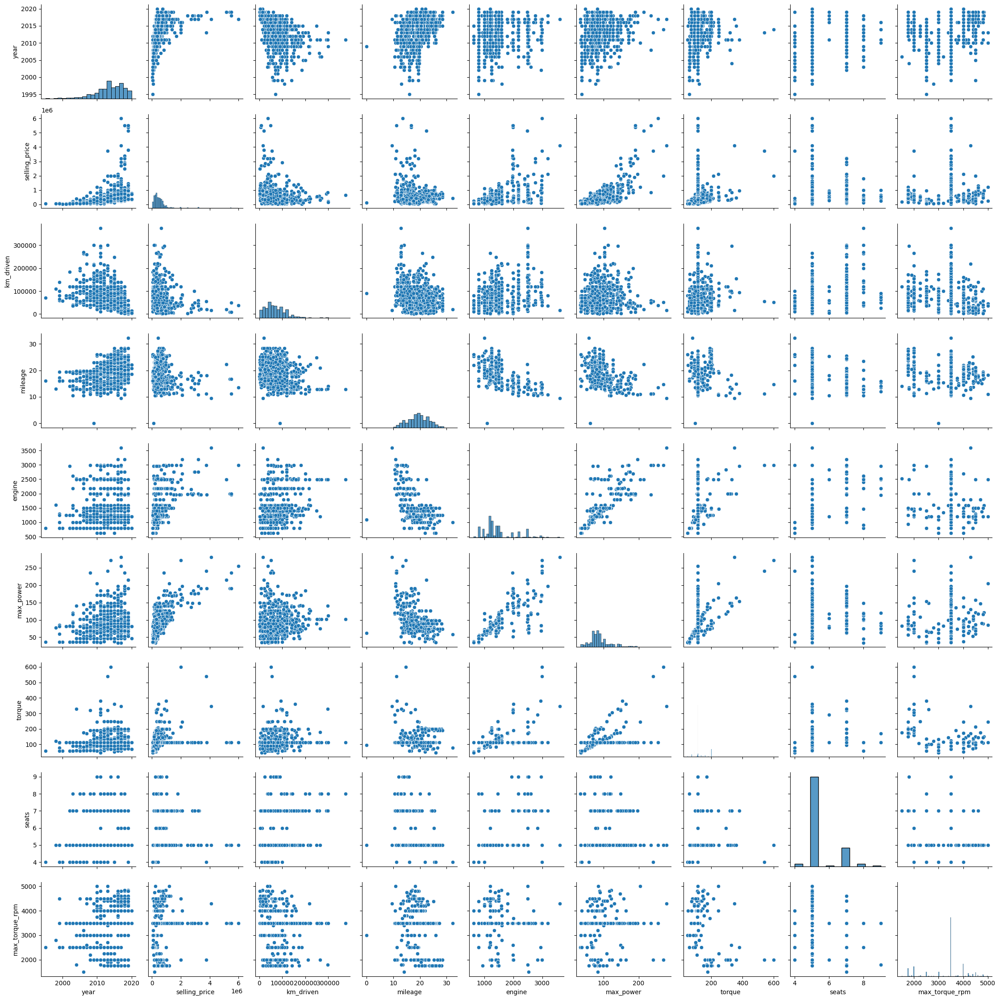

In [143]:
sns.pairplot(df_test)
plt.tight_layout()
plt.show()

**Выводы:**
* Если посмотреть на попарные распределения целевой переменной selling_price и переменных year, km_driven, max_power то можно выделить явную зависимость (например, от года цена зависит почти экспоненциально). Т.е. предположить связь можно.
* Да, можно, к примеру max_power и engine - прямая корреляция. (но таких примеров немного)
* Конечно есть минимальные отличия у некоторых пар признаков, но в целом они имеют идентичный характер и схожи. Так что у нас всё хорошо с train и test выборками.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [144]:
correlation_matrix = df_train.select_dtypes(include='number').corr()
correlation_matrix

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.093863,0.041178,0.035333
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.193234,0.149953,-0.001957
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.075864,0.192328,-0.135348
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,0.150586,-0.451059,-0.312381
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.210715,0.652172,0.029353
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.298106,0.244112,0.100585
torque,0.093863,0.193234,0.075864,0.150586,0.210715,0.298106,1.000000,0.015760,-0.595291
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.015760,1.000000,-0.007972
max_torque_rpm,0.035333,-0.001957,-0.135348,-0.312381,0.029353,0.100585,-0.595291,-0.007972,1.000000


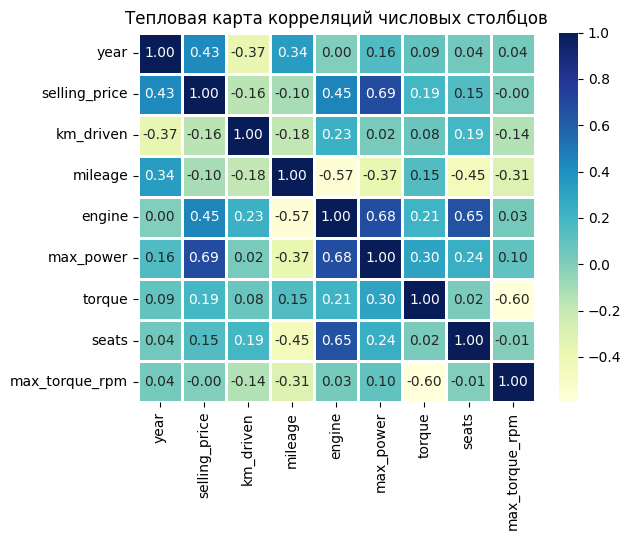

In [145]:
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='YlGnBu', linewidths=0.8)
plt.title('Тепловая карта корреляций числовых столбцов')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

**Выводы:**
* year и engine - имеют минимальную корреляцию (0.002819), потом идут selling_price и max_torque_rpm (-0.001957). Рассматриваем по модулю
* selling_price и max_power (0.692814), max_power и engine (0.681117), seats и engine (0.652172) - наблюдается сильная положительная линейная зависимость
* Да, правильно, так как между признаками отрицательная корреляция (-0.37), т.е. обратная зависимость. Но при этом значение не столь большое, чтобы точно сказать, что эти две переменные имеют точную обратную `линейную` зависимость. Она обратная, но не то чтобы линейная



### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


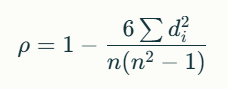

In [146]:
def spearman_correlation(x, y):
    rank_x = np.argsort(np.argsort(x)) + 1
    rank_y = np.argsort(np.argsort(y)) + 1
    d = rank_x - rank_y
    return 1 - (6 * np.sum(d**2)) / (len(x) * (len(x)**2 - 1))

spearman = spearman_correlation(df_train['selling_price'], df_train['max_power'])
print(f"Коэффициент Спирмена: {spearman}")


spearman_library = df_train.select_dtypes(include='number').corr(method='spearman')
print(f"Коэффициент Спирмена (библиотечный метод): {spearman_library.loc['selling_price', 'max_power']}")
print(f"Разница: {spearman-spearman_library.loc['selling_price', 'max_power']}")

Коэффициент Спирмена: 0.6123524312769941
Коэффициент Спирмена (библиотечный метод): 0.6122575511202892
Разница: 9.48801567048907e-05


In [147]:
from phik import phik_matrix

df_train.phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997906,0.998695,0.999985,0.999714
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.381639,0.249583,0.288178,0.306871
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.548019,0.196447,0.140770
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.017292
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236006,0.292122,0.450714,0.605266
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331904,0.078358,0.032173,0.135697
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511877,0.174791,0.045734,0.164690
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121438,0.048644,0.046741,0.196048
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687235,0.443622,0.679979,0.411986
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.720780,0.577417,0.603400,0.690561


interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


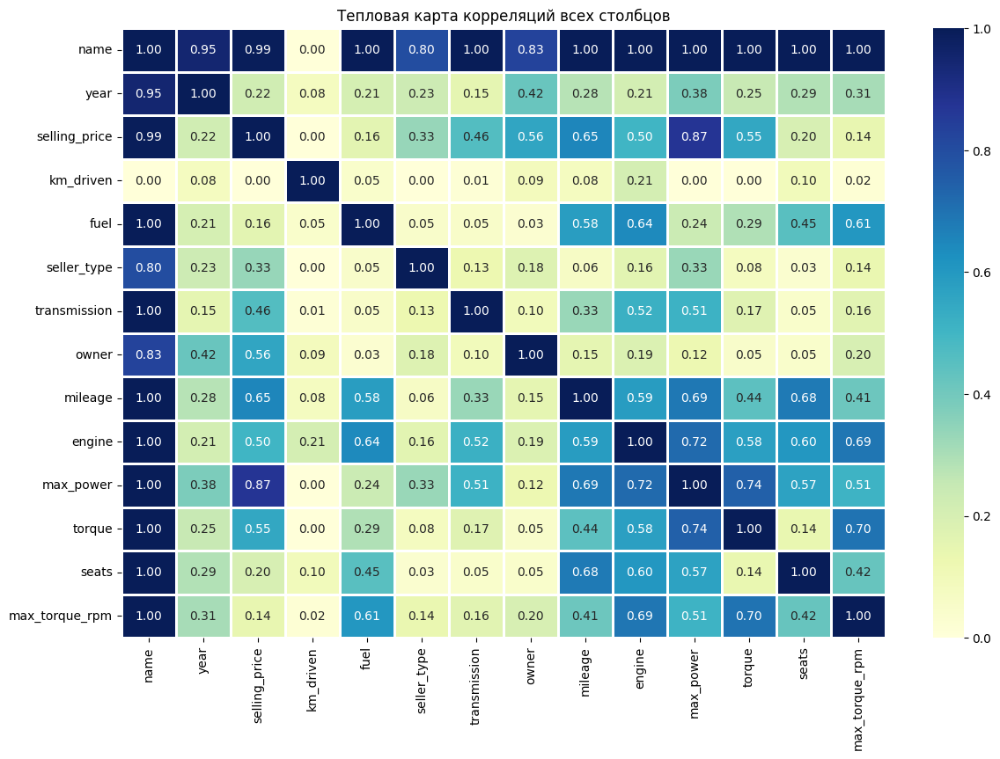

In [148]:
plt.figure(figsize=(14, 9))
sns.heatmap(df_train.phik_matrix(), annot=True, fmt=".2f", cmap='YlGnBu', linewidths=0.8)
plt.title('Тепловая карта корреляций всех столбцов')
plt.show()

**Выводы:**
* Результаты собственной реализации и реализации через библиотечный метод почти не отличаются (корреляции Спирмена)
* Точно есть прямая корреляция между selling_price и millage (0.65), selling_price и owner (0.56), engine и fuel (0.64). Остальные зависимости +- те же.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [149]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [150]:
df_train_numeric = df_train.select_dtypes(include='number').copy()
df_test_numeric = df_test.select_dtypes(include='number').copy()

In [151]:
y_train = df_train_numeric['selling_price']
X_train = df_train_numeric.drop(['selling_price', 'mileage', 'max_torque_rpm'], axis=1)

In [152]:
assert X_train.shape == (5840, 6)

In [153]:
y_test = df_test_numeric['selling_price']
X_test = df_test_numeric.drop(['selling_price', 'mileage', 'max_torque_rpm'], axis=1)

In [154]:
assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [155]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model = LinearRegression()
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

df_results = pd.DataFrame(columns=['R²', 'MSE'])

df_results.loc['Train', 'R²'] = round(r2_score(y_train, y_train_pred), 3)
df_results.loc['Train', 'MSE'] = round(MSE(y_train, y_train_pred), 3)
df_results.loc['Test', 'R²'] = round(r2_score(y_test, y_test_pred), 3)
df_results.loc['Test', 'MSE'] = round(MSE(y_test, y_test_pred), 3)
df_results

,R²,MSE
Train,0.592,117083798995.425995
Test,0.598,231305446444.917999


**Выводы:**
* Линейная регрессия обучилась неплохо, с учётом того, что R² не ниже 0.592. Но в целом улучшить модель ещё точно стоит.
* Сложно однозначно сказать, есть ли переобучении модели. С одной стороны, R² на тестовой выборке чуть больше, чем на обучающей, но при этом с другой стороны, MSE на тесте почти в 2 раза больше, чем на обучающей, что говорить уже об переобучении модели, ведь ошибка не должна быть настолько больше. Поэтому я всё-таки склоняюсь, что модель переобучена.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

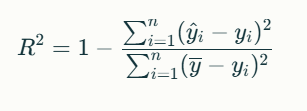

`В числители формулы стоит RSS - это сумма квадратов ошибок которая измеряет, насколько хорошо модель предсказывает фактические данные. Чем меньше эта сумма, тем лучше модель подходит к данным.`

`В знаминатели стоит TSS - это общая сумма квадратов которая измеряет общую вариацию зависимой переменной относительно её среднего значения, насколько сильно данные разбросаны относительно среднего значения`

In [156]:
def calculate_r2(y_true, y_pred):
    y_mean = y_true.mean() # Среднее значение фактических значений
    rss = ((y_pred - y_true) ** 2).sum() # Сумма квадратов ошибок (RSS)
    tss = ((y_true - y_mean) ** 2).sum() # Общая сумма квадратов (TSS)
    r2 = 1 - (rss / tss)
    return r2

calculate_r2(y_test, y_test_pred)

0.5976096800062162

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

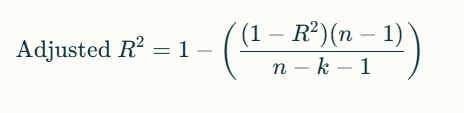

`В отличие от стандартного R², adj R²	учитывает размер выборки и количество экзогенных переменных. Т.е. значение adj R² будет более точным, когда у нас большая выборка с разнообразными данными и большим количеством экзогенных (независимых) переменных.`

In [157]:
n = len(y_test)
k = X_train.shape[1]

adjusted_r2 = 1 - ((1 - calculate_r2(y_test, y_test_pred)) * (n - 1)) / (n - k - 1)
print(f"Скорректированный R²: {adjusted_r2:.4f}")

Скорректированный R²: 0.5952


### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [158]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_scaled, y_train)

y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

df_results.loc['Train_scaled', 'R²'] = round(r2_score(y_train, y_train_pred), 3)
df_results.loc['Train_scaled', 'MSE'] = round(MSE(y_train, y_train_pred), 3)
df_results.loc['Test_scaled', 'R²'] = round(r2_score(y_test, y_test_pred), 3)
df_results.loc['Test_scaled', 'MSE'] = round(MSE(y_test, y_test_pred), 3)
df_results

,R²,MSE
Train,0.592,117083798995.425995
Test,0.598,231305446444.917999
Train_scaled,0.592,117083798995.425995
Test_scaled,0.598,231305446444.915009


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [159]:
coefficients = model.coef_
feature_names = X_train.columns

coef_df = pd.DataFrame({'Признак': feature_names, 'Коэффициент': coefficients})
coef_df

,Признак,Коэффициент
0,year,166225.996608
1,km_driven,-39671.843988
2,engine,52972.307906
3,max_power,322260.005636
4,torque,-15865.236690
5,seats,-31896.409192


**Вывод:** Коэффициент max_power наибольший по модулю, значит он самый важный. После него идёт year

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [160]:
from sklearn.linear_model import Lasso

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lasso_model = Lasso(alpha=1)
lasso_model.fit(X_train_scaled, y_train)

y_train_pred = lasso_model.predict(X_train_scaled)
y_test_pred = lasso_model.predict(X_test_scaled)

df_results.loc['Train_lasso', 'R²'] = round(r2_score(y_train, y_train_pred), 3)
df_results.loc['Train_lasso', 'MSE'] = round(MSE(y_train, y_train_pred), 3)
df_results.loc['Test_lasso', 'R²'] = round(r2_score(y_test, y_test_pred), 3)
df_results.loc['Test_lasso', 'MSE'] = round(MSE(y_test, y_test_pred), 3)
df_results

,R²,MSE
Train,0.592,117083798995.425995
Test,0.598,231305446444.917999
Train_scaled,0.592,117083798995.425995
Test_scaled,0.598,231305446444.915009
Train_lasso,0.592,117083799000.216003
Test_lasso,0.598,231306095878.054993


In [161]:
coefficients = lasso_model.coef_
feature_names = X_train.columns

coef_df = pd.DataFrame({'Признак': feature_names, 'Коэффициент': coefficients})
coef_df

,Признак,Коэффициент
0,year,166225.230892
1,km_driven,-39671.852082
2,engine,52973.359429
3,max_power,322258.117160
4,torque,-15863.816555
5,seats,-31895.623261


**Выводы:**
* Если брать параметры по умолчанию alpha=1, то lasso не даёт никаких улучшений и никакие веса не зануляются.
* Так как никакие признаки не занулились, а качество модели никак не улучшилось, то соответственно все признаки значимы и оказывают влияние на предсказываемую переменную selling_price (если бы какой-нибудь занулился - он не значим и его можно было бы исключить).
* Также L1 регуляризация служит для того чтобы предотвратить переобучение модели. В нашем случае качетсво модели от этого не изменилось, судя по метрикам R² и MSE

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [162]:
from sklearn.model_selection import GridSearchCV

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

param_grid = {
    'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4]  # Коэффициент регуляризации L1
}

lasso = Lasso()
grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=10)
# estimator - модель, которую вы хотите обучать и оптимизировать. В данном случае это экземпляр Lasso-регрессии.
# param_grid - параметры которые мы перебираем по заданным значениям, в данном случае только alpha (степень регуляризации)
# cv - на сколько частей будет разбит набор данных для кросс-валидации

grid_search.fit(X_train_scaled, y_train)

best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_

y_train_pred = best_model.predict(X_train_scaled)
y_test_pred = best_model.predict(X_test_scaled)

df_results.loc['Train_grid_search', 'R²'] = round(r2_score(y_train, y_train_pred), 3)
df_results.loc['Train_grid_search', 'MSE'] = round(MSE(y_train, y_train_pred), 3)
df_results.loc['Test_grid_search', 'R²'] = round(r2_score(y_test, y_test_pred), 3)
df_results.loc['Test_grid_search', 'MSE'] = round(MSE(y_test, y_test_pred), 3)
df_results

,R²,MSE
Train,0.592,117083798995.425995
Test,0.598,231305446444.917999
Train_scaled,0.592,117083798995.425995
Test_scaled,0.598,231305446444.915009
Train_lasso,0.592,117083799000.216003
Test_lasso,0.598,231306095878.054993
Train_grid_search,0.592,117083818302.046005
Test_grid_search,0.598,231347338146.68399


In [163]:
num_models_trained = len(param_grid['alpha']) * grid_search.cv
print(f"Количество обученных моделей в GridSearchCV: {num_models_trained}")
print(f"Лучший коэффициент регуляризации (alpha): {best_alpha}")

coefficients = best_model.coef_
feature_names = X_train.columns

coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
print("\nКоэффициенты Lasso регрессии:")
coef_df

Количество обученных моделей в GridSearchCV: 100
Лучший коэффициент регуляризации (alpha): 50

Коэффициенты Lasso регрессии:


,Feature,Coefficient
0,year,166174.112904
1,km_driven,-39643.603091
2,engine,52823.307024
3,max_power,322264.306249
4,torque,-15784.392810
5,seats,-31754.853871


**Выводы:**
* Всего обученных моделей 100
* У лучшей модели результаты с коэфициентом alpha=50 не занулился ни один коэфициент. Показатели R² и MSE все те же самые

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [164]:
from sklearn.linear_model import ElasticNet

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

param_grid = {
    'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4], # Коэффициент регуляризации L1
    'l1_ratio': [0.001, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95] # Соотношение L1 к L2
}

elastic_net = ElasticNet()
grid_search = GridSearchCV(estimator=elastic_net, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=10)
# estimator - модель, которую вы хотите обучать и оптимизировать. В данном случае это экземпляр Lasso-регрессии.
# param_grid - параметры которые мы перебираем по заданным значениям, в данном случае только alpha (степень регуляризации)
# cv - на сколько частей будет разбит набор данных для кросс-валидации

grid_search.fit(X_train_scaled, y_train)

best_alpha = grid_search.best_params_['alpha']
best_l1_ratio = grid_search.best_params_['l1_ratio']
best_model = grid_search.best_estimator_

y_train_pred = best_model.predict(X_train_scaled)
y_test_pred = best_model.predict(X_test_scaled)

df_results.loc['Train_elastic_net', 'R²'] = round(r2_score(y_train, y_train_pred), 3)
df_results.loc['Train_elastic_net', 'MSE'] = round(MSE(y_train, y_train_pred), 3)
df_results.loc['Test_elastic_net', 'R²'] = round(r2_score(y_test, y_test_pred), 3)
df_results.loc['Test_elastic_net', 'MSE'] = round(MSE(y_test, y_test_pred), 3)
df_results

,R²,MSE
Train,0.592,117083798995.425995
Test,0.598,231305446444.917999
Train_scaled,0.592,117083798995.425995
Test_scaled,0.598,231305446444.915009
Train_lasso,0.592,117083799000.216003
Test_lasso,0.598,231306095878.054993
Train_grid_search,0.592,117083818302.046005
Test_grid_search,0.598,231347338146.68399
Train_elastic_net,0.592,117088237187.742004
Test_elastic_net,0.596,232022557549.821991


In [165]:
num_models_trained = len(param_grid['alpha']) * len(param_grid['l1_ratio']) * grid_search.cv
print(f"Количество обученных моделей в GridSearchCV: {num_models_trained}")
print(f"Лучший коэффициент регуляризации (alpha): {best_alpha}")
print(f"Лучший коэффициент l1_ratio: {best_l1_ratio}")

coefficients = best_model.coef_
feature_names = X_train.columns

coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
print("\nКоэффициенты Lasso регрессии:")
coef_df

Количество обученных моделей в GridSearchCV: 700
Лучший коэффициент регуляризации (alpha): 0.1
Лучший коэффициент l1_ratio: 0.95

Коэффициенты Lasso регрессии:


,Feature,Coefficient
0,year,165653.051112
1,km_driven,-40018.485198
2,engine,54679.591165
3,max_power,319454.492602
4,torque,-15229.365749
5,seats,-32084.236631


**Выводы:**
* Всего обученных моделей 700
* У лучшей модели результаты с коэфициентом alpha=0.1 и l1_ratio=0.95 не занулился ни один коэфициент. Показатели R² и MSE все те же самые

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [166]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

**Почему такие преобразования ?**
* Во-первых, первые два слова в названии автомобиля достаточно точно характеризуют бренд и марку автомобиля
* Во-вторых, в тестовом датасете есть такие значения name_brand, которых почему-то нет в train, там Opel Astra к примеру (что критично, т.к. в дальнейшем будет OHE и линейная регрессия, которая не умеет работать с отсутствующими категориальными значениями!)

In [227]:
df_train['name_brand'] = df_train['name'].str.split(' ').str[0] +" "+ df_train['name'].str.split(' ').str[1]
df_test['name_brand'] = df_test['name'].str.split(' ').str[0] +" "+ df_test['name'].str.split(' ').str[1]

train_names = df_train['name_brand'].unique()
df_test['name_brand'] = df_test['name_brand'].apply(lambda x: x if x in train_names else 'Unknown')

<ipython-input-227-6f94da3fefec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['name_brand'] = df_train['name'].str.split(' ').str[0] +" "+ df_train['name'].str.split(' ').str[1]


In [209]:
df_train.head(1)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,name_brand
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4,1248,74.0,190.0,5,2000.0,Maruti Swift


In [228]:
df_train_cat = df_train.drop(['mileage', 'name', 'max_torque_rpm'], axis=1).copy()
df_test_cat = df_test.drop(['mileage', 'name', 'max_torque_rpm'], axis=1).copy()

In [229]:
y_train_cat = df_train_cat['selling_price']
X_train_cat = df_train_cat.drop(['selling_price'], axis=1)

In [230]:
y_test_cat = df_test_cat['selling_price']
X_test_cat = df_test_cat.drop(['selling_price'], axis=1)

In [231]:
assert X_train_cat.shape == (5840, 11)

In [232]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,name_brand
count,5840,5840,5840,5840,5840
unique,4,3,2,5,205
top,Diesel,Individual,Manual,First Owner,Maruti Swift
freq,3177,5223,5336,3603,558


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [233]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

X_train_cat['seats'] = X_train_cat['seats'].astype('category')
X_test_cat['seats'] = X_test_cat['seats'].astype('category')

X_train_cat = pd.get_dummies(X_train_cat, drop_first=True)
X_test_cat = pd.get_dummies(X_test_cat, drop_first=True)
X_test_cat.drop(['name_brand_Unknown'], axis=1, inplace=True)

for col in X_train_cat.columns:
    if col not in X_test_cat.columns:
        X_test_cat[col] = 0  # Добавляем недостающие столбцы с нулями

X_test_cat = X_test_cat[X_train_cat.columns]

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

**Выводы:**
* One-Hot Encoding (OHE) применяется для преобразования категориальных признаков в числовые. Это позволяет алгоритмам машинного обучения обрабатывать данные, т.к. к примеру линейная регрессия работать с категориальными данными работать не может.
* Чтобы избежать мультиколлинеарности мы удаляем 1 столбец с признаком, т.к. у нас по умолчанию если во всех отсальных столбцах 0, то следовательно это и есть то категориальное значение, которое мы удалили. Это логично, ведь все новые категориальные столбцы заполняются бинарными значениями (0 и 1).
* Если интерпритация модели не пострадает и это поможет снизить переобучение модели, то в целом это корректно. Также это зависит от данных на тестовой выборке, если там будут встречаться значения столбца, которые мы удалили, то мы не сможем корректно обучить и применить модель.  

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': [0.001, 0.1, 0.25, 0.5, 0.75, 1, 10, 15, 25, 50, 10**4] # Коэффициент регуляризации L1
}

ridge = Ridge()
grid_search = GridSearchCV(estimator=ridge,
                           param_grid=param_grid,
                           scoring='r2',
                           cv=10)

grid_search.fit(X_train_cat, y_train_cat)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test_cat)

best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_

y_train_pred = best_model.predict(X_train_cat)
y_test_pred = best_model.predict(X_test_cat)

df_results_cat = pd.DataFrame(columns=['R²', 'MSE'])
df_results_cat.loc['Train_Ridge', 'R²'] = round(r2_score(y_train_cat, y_train_pred), 3)
df_results_cat.loc['Train_Ridge', 'MSE'] = round(MSE(y_train_cat, y_train_pred), 3)
df_results_cat.loc['Test_Ridge', 'R²'] = round(r2_score(y_test_cat, y_test_pred), 3)
df_results_cat.loc['Test_Ridge', 'MSE'] = round(MSE(y_test_cat, y_test_pred), 3)

In [239]:
df_results_cat

,R²,MSE
Train_Ridge,0.885,33048340818.743
Test_Ridge,0.894,60977850270.607002


**Выводы:**
* Да, качество прогнозов существенно улучшилось - как по R², так и по MSE. Но модель скорее всего всё равно переобучается.


# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [244]:
def business_metric(y_true, y_pred):
    lower_bound = y_true * 0.9
    upper_bound = y_true * 1.1
    within_bounds = ((y_pred >= lower_bound) & (y_pred <= upper_bound)).sum()
    return within_bounds / len(y_true)

In [ ]:
# Обучение модели Ridge
ridge_param_grid = {'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4]}
ridge_grid_search = GridSearchCV(Ridge(), ridge_param_grid, scoring='r2', cv=10)
ridge_grid_search.fit(X_train_cat, y_train_cat)
ridge_best_model = ridge_grid_search.best_estimator_
ridge_predictions = ridge_best_model.predict(X_test_cat)

# Обучение модели Lasso
lasso_param_grid = {'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4]}
lasso_grid_search = GridSearchCV(Lasso(), lasso_param_grid, scoring='r2', cv=10)
lasso_grid_search.fit(X_train_cat, y_train_cat)
lasso_best_model = lasso_grid_search.best_estimator_
lasso_predictions = lasso_best_model.predict(X_test_cat)

# Обучение модели ElasticNet
elasticNet_param_grid = {
    'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4],
    'l1_ratio': [0.001, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95]
}
elasticNet_grid_search = GridSearchCV(estimator=ElasticNet(), param_grid=elasticNet_param_grid, scoring='r2', cv=10)
elasticNet_grid_search.fit(X_train_cat, y_train_cat)
elasticNet_best_model = elasticNet_grid_search.best_estimator_
elasticNet_predictions = elasticNet_best_model.predict(X_test_cat)

# Вычисление бизнес-метрики для всех моделей
df_business_metrics = pd.DataFrame(columns=['business_metric'])
df_business_metrics.loc['Ridge', 'business_metric'] = business_metric(y_test_cat.values, ridge_predictions)
df_business_metrics.loc['Lasso', 'business_metric'] = business_metric(y_test_cat.values, lasso_predictions)
df_business_metrics.loc['ElasticNet', 'business_metric'] = business_metric(y_test_cat.values, elasticNet_predictions)

In [247]:
df_business_metrics

,business_metric
Ridge,0.321
Lasso,0.351
ElasticNet,0.329


**Вывод:** лучше всего решает задачу бизнеса модель Lasso.


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [249]:
def custom_business_metric(y_true, y_pred):
    total_error = 0
    for true_value, pred_value in zip(y_true, y_pred):
        if pred_value < true_value:
            total_error += 2 * (true_value - pred_value)
        else:
            total_error += (pred_value - true_value)
    return total_error / len(y_true)

In [ ]:
from sklearn.metrics import make_scorer

my_scorer = make_scorer(custom_business_metric, greater_is_better=False)

# Обучение модели Ridge
ridge_param_grid = {'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4]}
ridge_grid_search = GridSearchCV(Ridge(), ridge_param_grid, scoring=my_scorer, cv=10)
ridge_grid_search.fit(X_train_cat, y_train_cat)
ridge_best_model = ridge_grid_search.best_estimator_
ridge_predictions = ridge_best_model.predict(X_test_cat)

# Обучение модели Lasso
lasso_param_grid = {'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4]}
lasso_grid_search = GridSearchCV(Lasso(), lasso_param_grid, scoring=my_scorer, cv=10)
lasso_grid_search.fit(X_train_cat, y_train_cat)
lasso_best_model = lasso_grid_search.best_estimator_
lasso_predictions = lasso_best_model.predict(X_test_cat)

# Обучение модели ElasticNet
elasticNet_param_grid = {
    'alpha': [0.001, 0.1, 0.25, 0.5, 1, 10, 15, 25, 50, 10*4],
    'l1_ratio': [0.001, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95]
}
elasticNet_grid_search = GridSearchCV(estimator=ElasticNet(), param_grid=elasticNet_param_grid, scoring=my_scorer, cv=10)
elasticNet_grid_search.fit(X_train_cat, y_train_cat)
elasticNet_best_model = elasticNet_grid_search.best_estimator_
elasticNet_predictions = elasticNet_best_model.predict(X_test_cat)

# Вычисление бизнес-метрики для всех моделей
df_business_metrics = pd.DataFrame(columns=['my_business_metric'])
df_business_metrics.loc['Ridge', 'my_business_metric'] = business_metric(y_test_cat.values, ridge_predictions)
df_business_metrics.loc['Lasso', 'my_business_metric'] = business_metric(y_test_cat.values, lasso_predictions)
df_business_metrics.loc['ElasticNet', 'my_business_metric'] = business_metric(y_test_cat.values, elasticNet_predictions)

In [252]:
df_business_metrics

,my_business_metric
Ridge,0.366
Lasso,0.365
ElasticNet,0.329


**Вывод:** лучше всего решает задачу бизнеса модель Ridge.


# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

**Объединил все преобрзования в одну ячейку (в один `preprocess.py` файл)**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import joblib

# Считывание данных
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

# Преобразвание данных
features = df_train.drop(columns=['selling_price'])
duplicates = features.duplicated(keep=False)
df_train = df_train.drop_duplicates(subset=features.columns, keep='first')
df_train.reset_index(drop=True, inplace=True)

def preprocess_data(df):
    df['mileage'] = df['mileage'].str.replace(' kmpl', '').str.replace(' km/kg', '').astype('float64')
    df['engine'] = df['engine'].str.replace(' CC', '').astype('float64')
    df['max_power'] = df['max_power'].str.replace(' bhp', '')
    df['max_power'] = pd.to_numeric(df['max_power'], errors='coerce')

    df[['torque', 'max_torque_rpm']] = df['torque'].str.extract(r'([\d.]+)\s*Nm\s*@\s*([\d.]+)\s*rpm', expand=True)
    df['torque'] = df['torque'].astype(float)
    df['max_torque_rpm'] = df['max_torque_rpm'].astype(float)
    return df

df_train = preprocess_data(df_train)
df_test = preprocess_data(df_test)

for column in ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats']:
    median_value = df_train[column].median()
    df_train[column].fillna(median_value, inplace=True)
    df_test[column].fillna(median_value, inplace=True)

# Разделение и создание Pipeline
y_train = df_train['selling_price']
X_train = df_train.drop(['selling_price'], axis=1)

y_test = df_test['selling_price']
X_test = df_test.drop(['selling_price'], axis=1)

numerical_features = ["year", "km_driven", "mileage", "engine", "max_power", "torque", "seats", 'mileage', 'max_torque_rpm']
categorical_features = ["fuel", "seller_type", "transmission", "owner"]

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numerical_features),
        ("cat", OneHotEncoder(drop="first"), categorical_features),
    ]
)

pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("model", LinearRegression())
])

pipeline.fit(X_train, y_train)

score = pipeline.score(X_test, y_test)
print(f"R^2 на тестовой выборке: {score:.2f}")

joblib.dump(pipeline, "pipeline_model.pkl")

Код для сервисной части сохраняем в отдельный файл `app.py`

In [89]:
from fastapi import FastAPI, UploadFile, HTTPException
from fastapi.responses import StreamingResponse
from pydantic import BaseModel
from typing import List
import pandas as pd
import joblib
import io

pipeline = joblib.load(r"pipeline_model.pkl")

app = FastAPI()

class Item(BaseModel):
    year: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: float
    engine: int
    max_power: float
    torque: float
    seats: int
    max_torque_rpm: float

class Items(BaseModel):
    objects: List[Item]

@app.post("/predict_item")
def predict_item(item: Item) -> float:
    try:
        item_dict = item.dict()
        df = pd.DataFrame([item_dict])

        prediction = pipeline.predict(df)
        return prediction[0]
    except Exception as e:
        raise HTTPException(status_code=500, detail=str(e))

@app.post("/predict_items")
def predict_items(file: UploadFile):
    try:
        content = file.file.read()
        df = pd.read_csv(io.StringIO(content.decode("utf-8")))

        # Проверяем наличие необходимых колонок
        required_columns = [
            "year", "km_driven", "fuel", "seller_type", "transmission",
            "owner", "mileage", "engine", "max_power", "torque", "seats", 'max_torque_rpm'
        ]
        if not all(col in df.columns for col in required_columns):
            raise HTTPException(status_code=400, detail="Некорректный формат данных")

        predictions = pipeline.predict(df)
        df["predicted_price"] = predictions

        output = io.StringIO()
        df.to_csv(output, index=False)
        output.seek(0)

        # Возвращаем файл в ответе
        response = StreamingResponse(
            output,
            media_type="text/csv"
        )
        response.headers["Content-Disposition"] = "attachment; filename=predictions.csv"

        return response
    except Exception as e:
        raise HTTPException(status_code=500, detail=str(e))

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

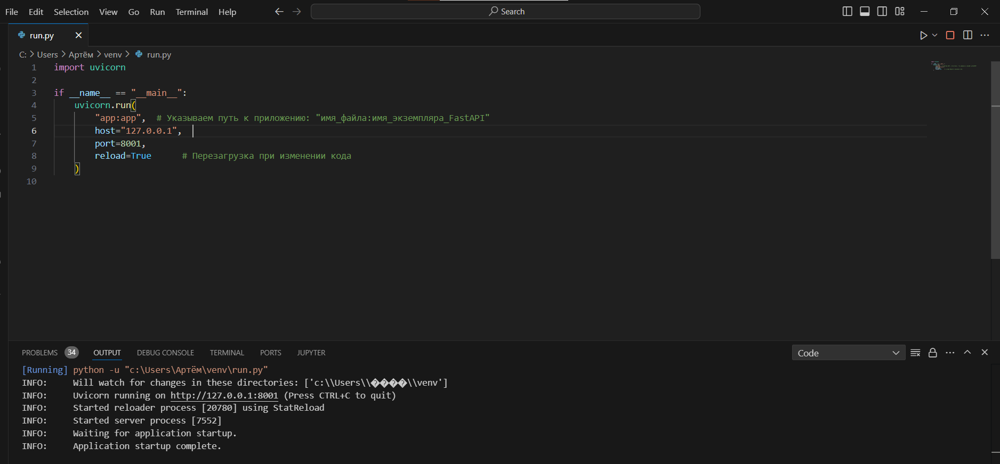

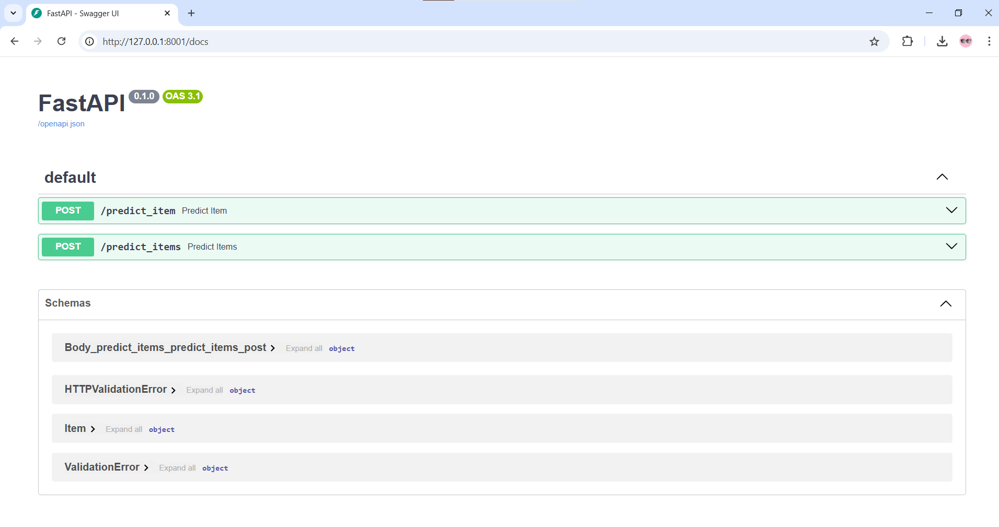

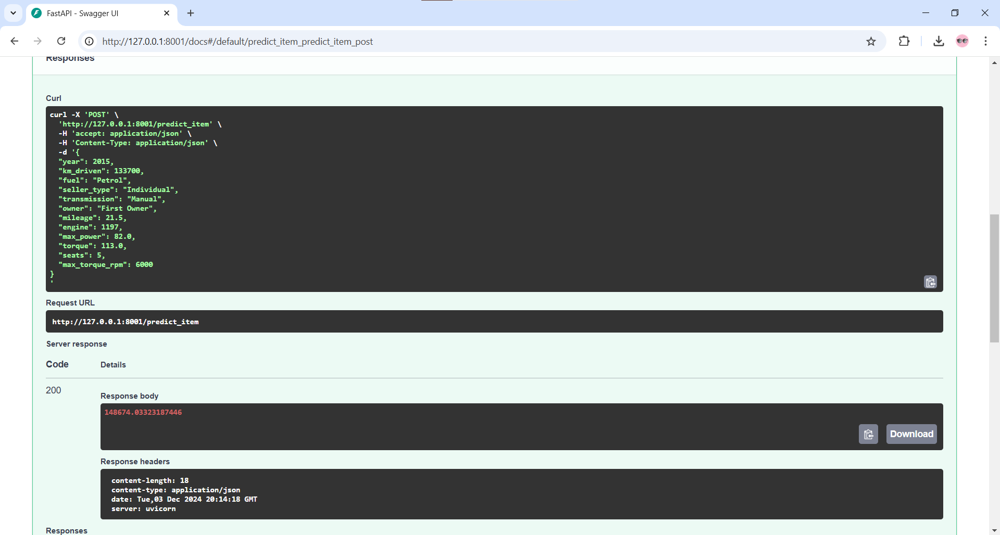

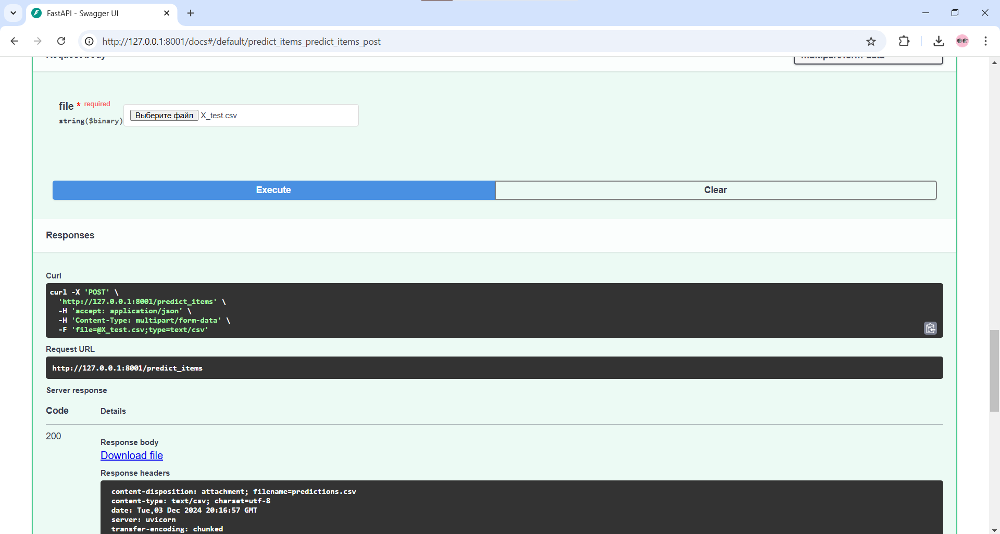

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>